In [2]:
%load_ext autoreload
%autoreload 2
from pathlib import Path

import os
os.environ['OPENBLAS_NUM_THREADS'] = '1'

# construct_training_set = True
construct_training_set = False

# use_cloudaugment = True
use_cloudaugment = False

# create U-Net folder
submission_dir = Path("../models/unet/")
submission_dir.mkdir(parents=True, exist_ok=True)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
# Things to add
# https://pytorch-lightning.readthedocs.io/en/latest/common/lightning_cli.html

In [21]:
%%file ../../scripts/train_unet.py

import shutil
import numpy as np
import pandas as pd
import pandas_path as path
from PIL import Image
import torch
import pytorch_lightning as pl
import glob
from pathlib import Path
import argparse

from pytorch_lightning import loggers as pl_loggers
import albumentations as A

from cloud_seg.models.unet.cloud_model import CloudModel

DATA_DIR = Path.cwd().parent.resolve() / "data/"
DATA_DIR_MODEL_TRAINING = DATA_DIR / "model_training/"
DATA_DIR_CLOUDLESS = DATA_DIR / 'cloudless/tif/'
DATA_DIR_CLOUDS = DATA_DIR / 'clouds/'

TRAIN_FEATURES = DATA_DIR / "train_features"
TRAIN_FEATURES_NEW = DATA_DIR / "train_features_new"

TRAIN_LABELS = DATA_DIR / "train_labels"

band_mean_std = np.load(DATA_DIR / 'measured_band_stats.npy', allow_pickle=True).item()

def main():
    
    parser = argparse.ArgumentParser(description='runtime parameters')
    parser.add_argument("--bands", nargs='+' , default=["B02", "B03", "B04", "B08"],
                        help="bands desired")
    parser.add_argument("--bands_new", nargs='+', default=None,
                        help="additional bands to use beyond original four")
    parser.add_argument("-cv", "--cross_validation_split", type=int, default=0,
                        help="cross validation split to use for training") 

    parser.add_argument("--seed", type=int , default=13579,
                        help="random seed for train test split")
   
    parser.add_argument("-v", "--verbose", action="store_true",
                        help="increase output verbosity")
   
    parser.add_argument("--augmentations_string", type=str, default='nrvfhfrr',
                        help="training augmentations to use")
    parser.add_argument("--log_dir", type=str, default='logs/',
                        help="directory to put logfiles")
    
    parser.add_argument("--gpu", action="store_true",
                        help="Use GPU")
    
    parser.add_argument("--test_run", action="store_true",
                        help="Subsample training and validation data")
    parser.add_argument("--test_run_nchips", type=int, default=512,
                        help="Subsample training and validation data to this size")
                
    parser.add_argument("--cloud_augment", action="store_true",
                        help="Use cloud augmentation")
              
    parser.add_argument("--num_workers", type=int, default=3,
                        help="number of data loader workers")
  
    parser.add_argument("--batch_size", type=int, default=8,
                        help="Batch size for model training")
  
    parser.add_argument("--learning_rate", type=float, default=1e-3,
                        help="Learning rate for model optimization")
  
    parser.add_argument("--optimizer", type=str, default='ADAM',
                        help="Optimizer to use", choices=['ADAM', 'SGD'])
  
    parser.add_argument("--backbone", type=str, default='efficientnet-b0',
                        help="Optimizer to use", choices=['efficientnet-b0', 'resnet34'])
  
    parser.add_argument("--loss_function", type=str, default='dice',
                        help="loss_function to use", choices=['SGD', 'Dice'])


    hparams = vars(parser.parse_args())
    hparams['bands_use'] = sorted(hparams['bands'] + hparams['bands_new']) if hparams['bands_new'] is not None else hparams['bands']
        
    hparams['persistent_workers'] = True
    hparams['precision'] = 32
    Path(hparams['log_dir']).mkdir(parents=True, exist_ok=True)
    
    pl.seed_everything(hparams['seed'], workers=True)

    augs = [hparams['augmentations_string'][i:i+2] for i in range(0, len(hparams['augmentations_string']), 2)]
    print(augs) 
    hparams['augmentations'] = {}
    if 'nr' in augs:
        hparams['augmentations']['Normalize'] = True
    if 'vf' in augs:
        hparams['augmentations']['VerticalFlip'] = True
    if 'hf' in augs:
        hparams['augmentations']['HorizontalFlip'] = True
    if 'rr' in augs:
        hparams['augmentations']['RandomRotate90'] = True

    print(hparams['augmentations'])
    
    if hparams['verbose']: print("Parameters are: ", hparams)

    dataset_str = 'originaldata'
    if hparams['cloud_augment']:
        dataset_str += '_cloudaugment'
    
    
    val_x = pd.read_csv(DATA_DIR_MODEL_TRAINING / f"validate_features_meta_cv{hparams['cross_validation_split']}.csv")
    val_y = pd.read_csv(DATA_DIR_MODEL_TRAINING / f"validate_labels_meta_cv{hparams['cross_validation_split']}.csv")
    
    # shuffle validation, such that each batch will have samples from different locations,
    # as validation_dataloader has shuffle=False
    val_x = val_x.sample(frac=1, random_state=42).reset_index(drop=True)
    val_y = val_y.sample(frac=1, random_state=42).reset_index(drop=True)
    
    if hparams['verbose']: print(val_y.head())
    
    train_x = pd.read_csv(DATA_DIR_MODEL_TRAINING / f"train_features_meta_cv{hparams['cross_validation_split']}.csv")
    train_y = pd.read_csv(DATA_DIR_MODEL_TRAINING / f"train_labels_meta_cv{hparams['cross_validation_split']}.csv")

    if not hparams['cloud_augment']:
        
        df_cloudbank = None
    
    if hparams['cloud_augment']:

        train_x_cloudless = pd.read_csv(DATA_DIR_MODEL_TRAINING / f"train_features_cloudless_meta_cv{hparams['cross_validation_split']}.csv", index=False)
        train_y_cloudless = pd.read_csv(DATA_DIR_MODEL_TRAINING / f"train_labels_cloudless_meta_cv{hparams['cross_validation_split']}.csv", index=False)

        train_y = train_y.append(train_y_cloudless, ignore_index=True)
        train_x = train_x.append(train_x_cloudless, ignore_index=True)

        df_cloudbank = pd.read_csv(DATA_DIR_MODEL_TRAINING / f"cloudbank_meta_cv{hparams['cross_validation_split']}.csv")


    if hparams['test_run']:
        nuse = hparams['test_run_nchips']

        train_x = train_x.iloc[:nuse]
        train_y = train_y.iloc[:nuse]

        val_x = val_x.iloc[:nuse]
        val_x = val_x.iloc[:nuse]

        df_cloudbank = df_cloudbank.iloc[:nuse] if df_cloudbank is not None else None
        
    band_means = [band_mean_std[i]['mean'] for i in hparams['bands_use']]
    band_stds = [band_mean_std[i]['std'] for i in hparams['bands_use']]

    # set up transforms in albumentations 
    train_transforms = []
    if hparams['augmentations']['Normalize']:
        train_transforms.append(A.Normalize(mean=band_means,
                                            std=band_stds,
                                            max_pixel_value=1.0,
                                            p=1.0))
    if hparams['augmentations']['VerticalFlip']:
        train_transforms.append(A.VerticalFlip(p=0.5))
    if hparams['augmentations']['HorizontalFlip']:
        train_transforms.append(A.HorizontalFlip(p=0.5))
    if hparams['augmentations']['RandomRotate90']:
        train_transforms.append(A.RandomRotate90(p=0.5))


    val_transforms = []
    if hparams['augmentations']['Normalize']:
        val_transforms.append(A.Normalize(mean=band_means,
                                            std=band_stds,
                                            max_pixel_value=1.0,
                                            p=1.0))

    if train_transforms==[]:
        train_transforms = None
    else:
        train_transforms = A.Compose(train_transforms)

    if val_transforms==[]:
        val_transforms = None
    else:
        val_transforms = A.Compose(val_transforms)

    # set up logger to have meaningful name
    augmentations_used_string = ''
    for k, v in hparams['augmentations'].items():
        if v:
            augmentations_used_string += '_'+k

    hparams['model_training_name'] = f"{len(hparams['bands_use'])}band_{dataset_str}_{hparams['backbone']}_{hparams['loss_function']}_{augmentations_used_string}"
    if hparams['test_run']:
        model_training_name = 'test'
    
    cloud_model = CloudModel(
        bands=hparams['bands_use'],
        x_train=train_x,
        y_train=train_y,
        x_val=val_x,
        y_val=val_y,
        cloudbank=df_cloudbank,
        train_transforms=train_transforms,
        val_transforms=val_transforms,
        hparams=hparams,
    )


    tb_logger = pl_loggers.TensorBoardLogger(save_dir=hparams['log_dir'], name=hparams['model_training_name']),

    checkpoint_callback = pl.callbacks.ModelCheckpoint(dirpath=hparams['log_dir'],
                                                       monitor="val_iou_epoch",
                                                       mode="max",
                                                       verbose=True,
    )

    early_stopping_callback = pl.callbacks.early_stopping.EarlyStopping(
        monitor="val_iou_epoch",
        patience=(cloud_model.patience * 3),
        mode="max",
        verbose=True,
    )

    lr_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')

    # "ddp_spawn" needed for interactive jupyter, but best to use "ddp" if not
    trainer = pl.Trainer(
        gpus=-1,
        # deterministic=True,
        fast_dev_run=False,
        # profiler="simple",
        # max_epochs=2,
        # overfit_batches=1,
        # auto_scale_batch_size=True,
        check_val_every_n_epoch=1,
        num_sanity_val_steps=2,
        precision=hparams['precision'],
        strategy="ddp",
        # plugins=DDPSpawnPlugin(find_unused_parameters=False),
        callbacks=[checkpoint_callback, early_stopping_callback, lr_monitor],
        logger=tb_logger,
    )

    # Fit the model
    trainer.fit(model=cloud_model)
    
if __name__=='__main__':
    main()

Overwriting ../../scripts/train_unet.py


In [5]:
%%file {submission_dir}/cloud_dataset.py

import numpy as np
import pandas as pd
import rasterio
import torch
from typing import Optional, List
import torchvision

class CloudDataset(torch.utils.data.Dataset):
    """Reads in images, transforms pixel values, and serves a
    dictionary containing chip ids, image tensors, and
    label masks (where available).
    """

    def __init__(
        self,
        x_paths: pd.DataFrame,
        bands: List[str],
        y_paths: Optional[pd.DataFrame] = None,
        cloudbank: Optional[pd.DataFrame] = None,
        transforms: Optional[list] = None,
    ):
        """
        Instantiate the CloudDataset class.

        Args:
            x_paths (pd.DataFrame): a dataframe with a row for each chip. There must be a column for chip_id,
                and a column with the path to the TIF for each of bands
            bands (list[str]): list of the bands included in the data
            y_paths (pd.DataFrame, optional): a dataframe with a row for each chip and columns for chip_id
                and the path to the label TIF with ground truth cloud cover
            cloudbank (pd.DataFrame, optional): a dataframe with a row for each cloud chip, columns for chip_id
                and the path to the cloud band TIFs and label TIF with ground truth cloud cover.
            transforms (list, optional): list of transforms to apply to the feature data (eg augmentations)
        """
        self.data  = x_paths
        self.label = y_paths
        self.cloudbank = cloudbank
        if cloudbank is not None:
            self.len_cloudbank = len(cloudbank)
        
        self.transforms = transforms
        self.bands = bands
        
    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx: int):
        # Loads an n-channel image from a chip-level dataframe
        img = self.data.loc[idx]
        band_arrs = []
        for band in self.bands:
            with rasterio.open(img[f"{band}_path"]) as b:
                band_arr = b.read(1).astype("float32")
            band_arrs.append(band_arr)
            
        x_arr = np.stack(band_arrs, axis=-1) # images in (B, H, W, C)

        # Load label if available
        if self.label is not None:
            label_path = self.label.loc[idx].label_path
            if label_path != 'None':
                with rasterio.open(label_path) as lp:
                    y_arr = lp.read(1).astype("float32")
            else:
                # This is a cloudless image, so sample a random cloud chip from cloudbank
                # load in new cloud label, and add cloud band data to x_arr bands
                idx_cloud = np.random.randint(0, self.len_cloudbank)
                cloud_paths = self.cloudbank.loc[idx_cloud]
                
                # load label
                with rasterio.open(cloud_paths.label_path) as lp:
                    y_arr = lp.read(1).astype("float32")  
                    
                # load cloud bands
                band_arrs = []
                for band in self.bands:
                    with rasterio.open(cloud_paths[f"{band}_path"]) as b:
                        band_arr = b.read(1).astype("float32")
                    band_arrs.append(band_arr)
                    
                # add clouds to cloudless image
                x_arr += np.stack(band_arrs, axis=-1)

        # Prepare dictionary for item
        item = {}
        item["chip_id"] = img.chip_id
        
        # Apply data augmentations, if provided
        if self.label is not None:
            # Apply same data augmentations to the label
            if self.transforms:
                transformed = self.transforms(image=x_arr, mask=y_arr)
                x_arr = transformed["image"]
                y_arr = transformed["mask"]
                
            item["label"] = y_arr
        if self.label is None:
            if self.transforms:
                x_arr = self.transforms(image=x_arr)["image"]
                
        x_arr = np.transpose(x_arr, [2, 0, 1]) # put images in (B, C, H, W)

        item["chip"] = x_arr
        
        return item

Writing ../models/unet/cloud_dataset.py


In [6]:
%%file {submission_dir}/losses.py
import numpy as np
import torch

from typing import Sequence, Optional, Union

def intersection_and_union(pred, true):
    """
    Calculates intersection and union for a batch of images.

    Args:
        pred (torch.Tensor): a tensor of predictions
        true (torc.Tensor): a tensor of labels

    Returns:
        intersection (int): total intersection of pixels
        union (int): total union of pixels
    """
    # valid_pixel_mask = true.ne(255)  # valid pixel mask
    # true = true.masked_select(valid_pixel_mask).to("cpu")
    # pred = pred.masked_select(valid_pixel_mask).to("cpu")

    # Intersection and union totals
    pred_flattened = pred.view(-1)
    true_flattened = true.view(-1)

    intersection = torch.logical_and(true_flattened, pred_flattened)
    union = torch.logical_or(true_flattened, pred_flattened)
    
    return torch.sum(intersection).float(), torch.sum(union).float()#, torch.sum(intersection) / torch.sum(union)

def dice_loss(pred, true, dice_smooth=1.):
    
    pred_flattened = pred.view(-1)
    true_flattened = true.view(-1)

    intersection = (pred_flattened * true_flattened).sum()
    
    return 1 - ((2. * intersection + dice_smooth) /
              (pred_flattened.sum() + true_flattened.sum() + dice_smooth))

class DiceLoss(torch.nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
                
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice


Writing ../models/unet/losses.py


In [7]:
%%file {submission_dir}/metrics.py

import numpy as np
import torch
import torchmetrics

class Intersection(torchmetrics.Metric):
    def __init__(self, dist_sync_on_step=False):
        super().__init__(dist_sync_on_step=dist_sync_on_step)

        self.add_state("intersection", default=torch.tensor(0), dist_reduce_fx="sum")
        self.add_state("total", default=torch.tensor(0), dist_reduce_fx="sum")

    def update(self, preds: torch.Tensor, target: torch.Tensor):
        preds, target = self._input_format(preds, target)
        assert preds.shape == target.shape

        self.intersection += torch.logical_and(preds.view(-1), target.view(-1))
        # self.correct += torch.sum(preds == target)
        # self.total += target.numel()

    def compute(self):
        return self.intersection.float()
        # return self.correct.float() / self.total

Writing ../models/unet/metrics.py


In [8]:
%%file {submission_dir}/callbacks.py

# Adapted from https://github.com/PyTorchLightning/Lightning-Bolts/blob/master/pl_bolts/callbacks/vision/confused_logit.py#L20-L167
from typing import Sequence

import torch
from pytorch_lightning import Callback, LightningModule, Trainer
from torch import Tensor, nn

from matplotlib import pyplot as plt
from matplotlib.axes import Axes
from matplotlib.figure import Figure

# from pytorch_lightning.utilities import rank_zero_only
# @rank_zero_only
class DisplayChipsCallback(Callback):  # pragma: no cover
    """Takes the input chip, true label, and label prediction
        trainer = Trainer(callbacks=[DisplayChips()])
    .. note:: Whenever called, this model will look for ``self.last_batch`` and ``self.last_logits``
              in the LightningModule.
    """

    def __init__(
        self,
        num_images_plot: int=4,
    ):
        """
        Args:
            top_k: How many  images we should plot
   
        """
        super().__init__()
        self.num_images_plot = num_images_plot

    def on_validation_epoch_end(
        self,
        trainer: Trainer,
        pl_module: LightningModule,
        # outputs: Sequence,
        # batch: Sequence,
        # batch_idx: int,
        # dataloader_idx: int,
    ) -> None:
        # show images only every 20 batches
        # if batch_idx != 0:
        #     return

        # pick the last batch and logits
        # x, y = batch["chip"], batch["label"]
        try:
            x = pl_module.last_x.to("cpu")
            y = pl_module.last_y.to("cpu")
            pred = pl_module.last_pred.to("cpu")
            
        except AttributeError as err:
            m = """please track the last_pred in the validation_step like so:
                def validation_step(...):
                    self.last_pred = your_pred
            """
            raise AttributeError(m) from err

        print(pred)
        self._plot(x, y, pred, trainer, pl_module)

    def _plot(
        self,
        x: Tensor,
        y: Tensor,
        pred: Tensor,
        trainer: Trainer,
        model: LightningModule,
    ) -> None:

        batch_size, c, w, h = x.size()

        # final batch may not be full size
        nimg_plt = self.min(batch_size, self.num_images_plot)
        
        fig, axarr = plt.subplots(nrows=nimg_plt, ncols=3, figsize=(15, 5*))
       
        for img_i in range(nimg_plt):
            xi = x[img_i].to("cpu")
            yi = y[img_i].to("cpu")
            predi = pred[img_i].to("cpu")
            
            self.__draw_data_sample(fig, axarr, img_i, 0, xi[0], "Chip")
            self.__draw_label_sample(fig, axarr, img_i, 1, yi, "True label")
            self.__draw_label_sample(fig, axarr, img_i, 2, predi, "Prediction")
            
        # model.logger.experiment.add_figure("validation_predictions", fig, global_step=trainer.global_step)
        # trainer.logger.experiment[0].add_image("validation_predictions", fig, global_step=trainer.global_step)
        # model.log("validation_predictions", fig, global_step=trainer.global_step)

    @staticmethod
    def __draw_data_sample(fig: Figure, axarr: Axes, row_idx: int, col_idx: int, img: Tensor, title: str) -> None:
        im = axarr[row_idx, col_idx].imshow(img)
        axarr[row_idx, col_idx].set_title(title, fontsize=20)
        
    @staticmethod
    def __draw_label_sample(fig: Figure, axarr: Axes, row_idx: int, col_idx: int, img: Tensor, title: str) -> None:
        im = axarr[row_idx, col_idx].imshow(img, vmin=0., vmax=1.)
        axarr[row_idx, col_idx].set_title(title, fontsize=20)
        
                

Writing ../models/unet/callbacks.py


In [9]:
%%file {submission_dir}/plotting_tools.py

import numpy as np
import torch
from torch import Tensor

from matplotlib import pyplot as plt
import xarray
import xrspatial.multispectral as ms

# from pytorch_lightning.utilities import rank_zero_only
# @rank_zero_only

def to_xarray(im_arr):
    """Put images in xarray.DataArray format"""

    return xarray.DataArray(im_arr, dims=["y", "x"])

def true_color_img(img, normalized=True):
    """Given the path to the directory of Sentinel-2 chip feature images,
    plots the true color image"""
    
    band_mean_std = {'B02': {'mean': 2848.064112016446,
    'std': 3156.9268464765087,
    'min': 0,
    'max': 27600},
    'B03': {'mean': 2839.0871485290295,
    'std': 2899.280144509762,
    'min': 0,
    'max': 26096},
    'B04': {'mean': 2741.2891076425326,
    'std': 2789.961608891907,
    'min': 0,
    'max': 23104},
    'B08': {'mean': 3657.9092112857143,
    'std': 2424.18942846055,
    'min': 0,
    'max': 19568}}

    if normalized:
        img[2] = img[2]*band_mean_std['B04']['std'] + band_mean_std['B04']['mean']
        img[1] = img[1]*band_mean_std['B03']['std'] + band_mean_std['B03']['mean']
        img[0] = img[0]*band_mean_std['B02']['std'] + band_mean_std['B02']['mean']
        
    red = to_xarray(img[2])
    green = to_xarray(img[1])
    blue = to_xarray(img[0])
    
    return ms.true_color(r=red, g=green, b=blue)

def plot_prediction_grid(x: Tensor, y: Tensor, pred: Tensor, chip_id, num_images_plot: int = 4, fontsize=18):

        batch_size, c, w, h = x.size()
        
        nimg_plt = min(batch_size, num_images_plot)

        fig, axarr = plt.subplots(nrows=nimg_plt, ncols=3, figsize=(15, 5*nimg_plt))
       
        for img_i in range(nimg_plt):
            
            chip_idi = chip_id[img_i]
            xi = true_color_img(x[img_i].to("cpu").numpy().astype(np.float32), normalized=True)
            yi = y[img_i].to("cpu")
            predi = pred[img_i].to("cpu")
            
            axarr[img_i, 0].imshow(xi)
            axarr[img_i, 0].set_title(f"{chip_idi}", fontsize=fontsize)
            
            axarr[img_i, 1].imshow(yi, vmin=0., vmax=1.)
            axarr[img_i, 1].set_title("True label", fontsize=fontsize)
            
            axarr[img_i, 2].imshow(predi, vmin=0., vmax=1.)
            axarr[img_i, 2].set_title("Prediction", fontsize=fontsize)
            
        plt.close(fig)
        
        return fig
                

Writing ../models/unet/plotting_tools.py


In [15]:
%%file {submission_dir}/cloud_model.py

from typing import Optional, List

import pandas as pd
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
import torch
import torchmetrics
# from pytorch_lightning.utilities import rank_zero_only
# from pytorch_lightning.loggers.base import rank_zero_experiment

from .cloud_dataset import CloudDataset
from .losses import intersection_and_union
from .losses import dice_loss
from .plotting_tools import plot_prediction_grid


class CloudModel(pl.LightningModule):
    def __init__(
        self,
        bands: List[str],
        x_train: Optional[pd.DataFrame] = None,
        y_train: Optional[pd.DataFrame] = None,
        x_val: Optional[pd.DataFrame] = None,
        y_val: Optional[pd.DataFrame] = None,
        cloudbank: Optional[pd.DataFrame] = None,
        train_transforms = None,
        val_transforms = None,
        hparams: dict = {},
    ):
        """
        Instantiate the CloudModel class based on the pl.LightningModule
        (https://pytorch-lightning.readthedocs.io/en/latest/common/lightning_module.html).

        Args:
            bands (list[str]): Names of the bands provided for each chip
            x_train (pd.DataFrame, optional): a dataframe of the training features with a row for each chip.
                There must be a column for chip_id, and a column with the path to the TIF for each of bands.
                Required for model training
            y_train (pd.DataFrame, optional): a dataframe of the training labels with a for each chip
                and columns for chip_id and the path to the label TIF with ground truth cloud cover.
                Required for model training
            x_val (pd.DataFrame, optional): a dataframe of the validation features with a row for each chip.
                There must be a column for chip_id, and a column with the path to the TIF for each of bands.
                Required for model training
            y_val (pd.DataFrame, optional): a dataframe of the validation labels with a for each chip
                and columns for chip_id and the path to the label TIF with ground truth cloud cover.
                Required for model training
            cloudbank (pd.DataFrame, optional): a dataframe of paths to additional clouds to sample from. 
                Optional for model training, but required if using chips where label_path=='None'
            hparams (dict, optional): Dictionary of additional modeling parameters.
        """
        super().__init__()
        self.hparams.update(hparams)
        self.save_hyperparameters()

        # required
        self.bands = bands
        self.num_channels = len(bands)
        
        # optional modeling params
        self.backbone = self.hparams.get("backbone", "efficientnet-b3")
        self.weights = self.hparams.get("weights", None)
        
        self.loss_function = self.hparams.get("loss_function", "dice")

        self.optimizer = self.hparams.get("optimizer", "ADAM")
        self.scheduler = self.hparams.get("scheduler", "PLATEAU")
        
        self.batch_size = self.hparams.get("batch_size", 8)
        self.learning_rate = self.hparams.get("learning_rate", 1e-3)
        self.momentum = self.hparams.get("momentum", 0.9)
        self.patience = self.hparams.get("patience", 5)
        self.learning_rate_patience = self.hparams.get("learning_rate_patience", 5)
        self.reduce_learning_rate_factor = self.hparams.get("reduce_learning_rate_factor", 0.1)

        self.num_workers = self.hparams.get("num_workers", 2)
        self.pin_memory = self.hparams.get("pin_memory", True)
        self.persistent_workers = self.hparams.get("persistent_workers", False)
        
        self.gpu = self.hparams.get("gpu", False)
        
        self.log_on_step = self.hparams.get("log_on_step", False)
        self.progress_bar = self.hparams.get("progress_bar", False)
        
        self.plot_validation_images = self.hparams.get("plot_validation_images", True)
        self.num_images_plot = self.hparams.get("num_images_plot", self.batch_size)

        self.train_transform = train_transforms
        self.val_transform = val_transforms

        # Instantiate datasets, model, and trainer params if provided
        self.train_dataset = CloudDataset(
            x_paths=x_train,
            bands=self.bands,
            y_paths=y_train,
            cloudbank=cloudbank,
            transforms=self.train_transform,
        )
        self.val_dataset = CloudDataset(
            x_paths=x_val,
            bands=self.bands,
            y_paths=y_val,
            transforms=self.val_transform,
        )
        
        # define some performance metrics using torchmetrics
        # self.train_accuracy = torchmetrics.Accuracy()
        # self.val_intersection = mymetrics.Intersection()
        self.val_IoU = torchmetrics.IoU(num_classes=2)
        self.train_IoU = torchmetrics.IoU(num_classes=2)

        self.model = self._prepare_model()

    ## Required LightningModule methods ##
    def forward(self, image: torch.Tensor):
        # Forward pass
        # output of model is (B, 1, H, W), so remove axis=1
        if self.loss_function == "BCE":
            # return raw logits in order to use BCEWithLogitsLoss
            # which is more stable than BCE:
            # https://pytorch.org/docs/stable/generated/torch.nn.BCEWithLogitsLoss.html#torch.nn.BCEWithLogitsLoss
            return self.model(image).view(-1, 512, 512)
        
        else:
            return torch.sigmoid(self.model(image).view(-1, 512, 512))
            

    def calculate_loss(self, chip, label, preds):
        if self.loss_function.upper()=="BCE":
            loss = torch.nn.BCEWithLogitsLoss(reduction="none")(preds, label.float()).mean()
            
        if self.loss_function.upper()=="DICE":
            loss = dice_loss(preds, label)

            # loss = DiceLoss()(preds, label)
            # loss = smp.losses.JaccardLoss()(preds, label)
        #if self.loss_function.upper()=="IOU":
        #     loss = torchmetrics.IoU(num_classes=2)(preds, label)

        return loss

    def training_step(self, batch: dict, batch_idx: int):
        """
        Training step.

        Args:
            batch (dict): dictionary of items from CloudDataset of the form
                {'chip_id': list[str], 'chip': list[torch.Tensor], 'label': list[torch.Tensor]}
            batch_idx (int): batch number
        """
        if self.train_dataset.data is None:
            raise ValueError(
                "x_train and y_train must be specified when CloudModel is instantiated to run training"
            )

        # Switch on training mode
        self.model.train()
        torch.set_grad_enabled(True)

        # Load images and labels
        x = batch["chip"]
        y = batch["label"].long()
        if self.gpu:
            x, y = x.cuda(non_blocking=True), y.cuda(non_blocking=True)

        # Forward pass
        preds = self.forward(x)

        loss = self.calculate_loss(x, y, preds)

        if self.loss_function == "BCE":
            preds = torch.sigmoid(preds)
            
        preds = (preds > 0.5) * 1  # convert to int

        batch_intersection, batch_union = intersection_and_union(preds, y)
    
        self.train_IoU(preds, y)

        self.log("train_performance", 
                 {"iou": self.train_IoU},
                 on_step=self.log_on_step, on_epoch=True, prog_bar=self.progress_bar)
        self.log("train_loss", loss, on_step=self.log_on_step, on_epoch=True, prog_bar=self.progress_bar)

        return loss

    def validation_step(self, batch: dict, batch_idx: int):
        """
        Validation step.

        Args:
            batch (dict): dictionary of items from CloudDataset of the form
                {'chip_id': list[str], 'chip': list[torch.Tensor], 'label': list[torch.Tensor]}
            batch_idx (int): batch number
        """
        if self.val_dataset.data is None:
            raise ValueError(
                "x_val and y_val must be specified when CloudModel is instantiated to run validation"
            )

        # Switch on validation mode
        self.model.eval()
        torch.set_grad_enabled(False)

        # Load images and labels
        x = batch["chip"]
        y = batch["label"].long()
        chip_id = batch["chip_id"]
        if self.gpu:
            x, y = x.cuda(non_blocking=True), y.cuda(non_blocking=True)

        preds = self.forward(x)

        loss = self.calculate_loss(x, y, preds)

        if self.loss_function == "BCE":
            preds = torch.sigmoid(preds)
            
        preds = (preds > 0.5) * 1  # convert to int

        if self.plot_validation_images:
            # keep to pass to validation_epoch_end and plot
            self.last_x = x
            self.last_y = y
            self.last_pred = preds
            self.last_chip_id = chip_id

        # Log batch IOU
        batch_intersection, batch_union = intersection_and_union(preds, y)
        self.val_IoU(preds, y)

        self.log("val_performance", 
                 {"iou": self.val_IoU},
                 on_step=self.log_on_step, on_epoch=True, prog_bar=self.progress_bar)
                 
        self.log("val_loss", loss, on_step=self.log_on_step, on_epoch=True, prog_bar=self.progress_bar)
        
        # keep seperate to use for early stopping
        self.log("val_iou", self.val_IoU, on_step=True, on_epoch=True, prog_bar=self.progress_bar)

        return {"loss": loss}#, "x": x, "y": y, "pred": preds}

#     def validation_step_end(self, batch_parts):
#         gpu_use = 0
#         # print(batch_parts['x'][gpu_use].size())
#         return {"x": batch_parts["x"][gpu_use], "y": batch_parts["y"][gpu_use], "pred": batch_parts["pred"][gpu_use]}

    # @rank_zero_only
    # @rank_zero_experiment
    
    def validation_epoch_end(self, outputs):
        # idevice = self.last_x.get_device()
        # if idevice == 0:
        # if self.global_rank==0:
        if self.plot_validation_images:
            self.logger[0].experiment.add_figure("chip_label_prediction", 
                                                 plot_prediction_grid(self.last_x,
                                                                      self.last_y,
                                                                      self.last_pred,
                                                                      self.last_chip_id,
                                                                      num_images_plot=self.num_images_plot),
                                                 self.current_epoch)

        # if batch_idx == 0:
            # print(out)
            # for out in validation_step_outputs[:1]:
            #     # output from each gpu
            #     print(out)
            
    def train_dataloader(self):
        # DataLoader class for training
        return torch.utils.data.DataLoader(
            self.train_dataset,
            batch_size=self.batch_size|self.hparams.batch_size,
            num_workers=self.num_workers,
            shuffle=True,
            pin_memory=self.pin_memory,
            persistent_workers=self.persistent_workers,
        )

    def val_dataloader(self):
        # DataLoader class for validation
        return torch.utils.data.DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            shuffle=False,
            drop_last=self.plot_validation_images, # if plotting last batch images ensure full last batch
            pin_memory=self.pin_memory,
            persistent_workers=self.persistent_workers,
        )

    def configure_optimizers(self):
        
        if self.optimizer.upper()=="ADAM":
            optimizer = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate)
            # sch = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=10)
            # sch = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(opt, T_0=10, eta_min=1e-5)

        if self.optimizer.upper()=="SGD":
            optimizer = torch.optim.SGD(self.model.parameters(), lr=self.learning_rate, momentum=self.momentum)
        
        if self.scheduler.upper()=="EXPONENTIAL":
            scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)
            
        if self.scheduler.upper()=="COSINEANNEALING":
            scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, eta_min=1e-5)
            
        if self.scheduler.upper()=="PLATEAU":
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max',
                                                                   factor=self.reduce_learning_rate_factor, patience=self.learning_rate_patience)
            
            return {"optimizer": optimizer, 
                    "lr_scheduler": {
                        "scheduler": scheduler,
                        "monitor": "val_iou",
                    },
            }
                                       
        return [optimizer], [scheduler]
                
    ## Convenience Methods ##
    def _prepare_model(self):
        # Instantiate U-Net model
        unet_model = smp.Unet(
            encoder_name=self.backbone,
            encoder_weights=self.weights,
            in_channels=self.num_channels,
            classes=1,
        )
        if self.gpu:
            unet_model.cuda()

        return unet_model

Overwriting ../models/unet/cloud_model.py


In [19]:
band_mean_std = np.load('measured_band_stats.npy', allow_pickle=True).item()
band_mean_std = {'B02': {'mean': 2848.064112016446,
  'std': 3156.9268464765087,
  'min': 0,
  'max': 27600},
 'B03': {'mean': 2839.0871485290295,
  'std': 2899.280144509762,
  'min': 0,
  'max': 26096},
 'B04': {'mean': 2741.2891076425326,
  'std': 2789.961608891907,
  'min': 0,
  'max': 23104},
 'B08': {'mean': 3657.9092112857143,
  'std': 2424.18942846055,
  'min': 0,
  'max': 19568}}
band_mean_std

{'B02': {'mean': 2848.064112016446,
  'std': 3156.9268464765087,
  'min': 0,
  'max': 27600},
 'B03': {'mean': 2839.0871485290295,
  'std': 2899.280144509762,
  'min': 0,
  'max': 26096},
 'B04': {'mean': 2741.2891076425326,
  'std': 2789.961608891907,
  'min': 0,
  'max': 23104},
 'B08': {'mean': 3657.9092112857143,
  'std': 2424.18942846055,
  'min': 0,
  'max': 19568}}

In [20]:
# Set up pytorch_lightning.Trainer object
# from pytorch_lightning.plugins import DDPSpawnPlugin
# from unet_src.callbacks import DisplayChipsCallback

from pytorch_lightning import loggers as pl_loggers
import albumentations as A

pl.seed_everything(13579, workers=True)

# test_run = False
test_run = True

dataset_str = 'originaldata'
if use_cloudaugment:
    dataset_str += '_cloudaugment'
    
hparams = {}
hparams["gpu"] = False #True
hparams["num_workers"] = 6
hparams["persistent_workers"] = True
hparams["batch_size"] = 8

hparams["learning_rate"] = 1.e-3  
hparams["optimizer"] = "ADAM"  

# hparams["backbone"] = "resnet34"
hparams["backbone"] = "efficientnet-b0"

# hparams["loss_function"] = "BCE"
hparams["loss_function"] = "dice"

precision = 32

if use_cloudaugment:
    cloudbank = df_cloudbank
else:
    cloudbank = None

# construct some augmentations
# transforms = None

# transforms = A.Compose([
#     A.HorizontalFlip(p=0.5),
,
#     A.RandomRotate90(p=0.5),
#     A.Transpose(p=0.5),
# ])

# Set up augmentations using albumentations
hparams['augmentations'] = {}
hparams['augmentations']['Normalize'] = True
hparams['augmentations']['VerticalFlip'] = True
hparams['augmentations']['HorizontalFlip'] = True
hparams['augmentations']['RandomRotate90'] = True

band_means = [band_mean_std[i]['mean'] for i in BANDS_USE]
band_stds = [band_mean_std[i]['std'] for i in BANDS_USE]

train_transforms = []
if hparams['augmentations']['Normalize']:
    train_transforms.append(A.Normalize(mean=band_means,
                                        std=band_stds,
                                        max_pixel_value=1.0,
                                        p=1.0))
if hparams['augmentations']['VerticalFlip']:
    train_transforms.append(A.VerticalFlip(p=0.5))
if hparams['augmentations']['HorizontalFlip']:
    train_transforms.append(A.HorizontalFlip(p=0.5))
if hparams['augmentations']['RandomRotate90']:
    train_transforms.append(A.RandomRotate90(p=0.5))
                
    
val_transforms = []
if hparams['augmentations']['Normalize']:
    val_transforms.append(A.Normalize(mean=band_means,
                                        std=band_stds,
                                        max_pixel_value=1.0,
                                        p=1.0))
    
if train_transforms==[]:
    train_transforms=None
else:
    train_transforms = A.Compose(train_transforms)

if val_transforms==[]:
    val_transforms=None
else:
    val_transforms = A.Compose(val_transforms)

cloud_model = CloudModel(
    bands=BANDS_USE,
    x_train=train_x,
    y_train=train_y,
    x_val=val_x,
    y_val=val_y,
    cloudbank=cloudbank,
    train_transforms=train_transforms,
    val_transforms=val_transforms,
    hparams=hparams,
)

# set up logger to have meaningful name
augmentations_used_string = ''
for k, v in hparams['augmentations'].items():
    if v:
        augmentations_used_string += '_'+k
        

model_training_name = f"{len(BANDS_USE)}band_{dataset_str}_{hparams['backbone']}_{hparams['loss_function']}_{augmentations_used_string}"
if test_run:
    model_training_name = 'test'
tb_logger = pl_loggers.TensorBoardLogger(save_dir="lightning_logs/", name=model_training_name),

checkpoint_callback = pl.callbacks.ModelCheckpoint(
    monitor="val_iou_epoch", mode="max", verbose=True
)

early_stopping_callback = pl.callbacks.early_stopping.EarlyStopping(
    monitor="val_iou_epoch",
    patience=(cloud_model.patience * 3),
    mode="max",
    verbose=True,
)

lr_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')

# "ddp_spawn" needed for interactive jupyter, but best to use "ddp" if not
trainer = pl.Trainer(
    gpus=-1,
    # deterministic=True,
    fast_dev_run=False,
    # profiler="simple",
    max_epochs=1,
    # overfit_batches=1,
    # auto_scale_batch_size=True,
    check_val_every_n_epoch=1,
    num_sanity_val_steps=2,
    precision=precision,
    strategy="ddp_spawn",
    # plugins=DDPSpawnPlugin(find_unused_parameters=False),
    callbacks=[checkpoint_callback, early_stopping_callback, lr_monitor],#, DisplayChipsCallback()],
    # callbacks=[DisplayChipsCallback()],

    logger=tb_logger,
)

# Find the largest batch size that fits on GPU
# tuner = pl.tuner.tuning.Tuner(trainer)

# # Invoke method
# new_batch_size = tuner.scale_batch_size(cloud_model)
# new_batch_size = trainer.tune(cloud_model)

# print(new_batch_size)

Global seed set to 13579
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


In [21]:
# Fit the model
trainer.fit(model=cloud_model)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
Global seed set to 13579
initializing distributed: GLOBAL_RANK: 0, MEMBER: 1/8
Global seed set to 13579
initializing distributed: GLOBAL_RANK: 1, MEMBER: 2/8
Global seed set to 13579
initializing distributed: GLOBAL_RANK: 2, MEMBER: 3/8
Global seed set to 13579
initializing distributed: GLOBAL_RANK: 3, MEMBER: 4/8
Global seed set to 13579
initializing distributed: GLOBAL_RANK: 4, MEMBER: 5/8
Global seed set to 13579
initializing distributed: GLOBAL_RANK: 5, MEMBER: 6/8
Global seed set to 13579
initializing distributed: GLOBAL_RANK: 6, MEMBER: 7/8
Global seed set to 13579
initializing distributed: GLOBAL_RANK: 7, MEMBER: 8/8
----------------------------------------------------------------------------------------------------
distributed_backend=nccl
All distributed processes registered. Starting with 8 processes
----------------------------------------------------------------------------------------------------

Set SLURM handle sig

Epoch 0:   0%|          | 0/4 [00:00<?, ?it/s]                        

Global seed set to 13579
Global seed set to 13579
Global seed set to 13579
Global seed set to 13579
Global seed set to 13579
Global seed set to 13579
Global seed set to 13579
/global/homes/g/gstein/.local/lib/python3.8/site-packages/pytorch_lightning/utilities/data.py:59: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(
Global seed set to 13579
/global/homes/g/gstein/.local/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:412: UserWarning: The number of training samples (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 0:  50%|█████     | 2/4 [00:15<00:15,  7.71s/it, loss=0.579, v_num=53]
Validating: 0it [00:00, ?it/s]
Epoch 0: 100%|██████████| 4/4 [00:16<00:00,  4.02s/it, loss=0.579, v_num=53]
                                                         

[rank: 7] Metric val_iou_epoch improved. New best score: 0.324
[rank: 0] Metric val_iou_epoch improved. New best score: 0.324
[rank: 6] Metric val_iou_epoch improved. New best score: 0.324
[rank: 3] Metric val_iou_epoch improved. New best score: 0.324
[rank: 1] Metric val_iou_epoch improved. New best score: 0.324
[rank: 5] Metric val_iou_epoch improved. New best score: 0.324
[rank: 2] Metric val_iou_epoch improved. New best score: 0.324
[rank: 4] Metric val_iou_epoch improved. New best score: 0.324
Epoch 0, global step 1: val_iou_epoch reached 0.32395 (best 0.32395), saving model to "/global/cscratch1/sd/gstein/machine_learning/cloud_cover/notebooks/test/53/checkpoints/epoch=0-step=1.ckpt" as top 1


Epoch 0: 100%|██████████| 4/4 [00:16<00:00,  4.11s/it, loss=0.579, v_num=53]


/global/homes/g/gstein/.local/lib/python3.8/site-packages/pytorch_lightning/plugins/training_type/ddp_spawn.py:307: UserWarning: cleaning up ddp environment...
  rank_zero_warn("cleaning up ddp environment...")


In [ ]:
# tb_loggers
trainer.logger, trainer.logger[0]

# trainer.logger#.experiment


In [ ]:
!nvidia-smi


In [ ]:
# !kill -9 74028
# !pkill -9 -f *cloud_cover*
!ps -ef | grep 'cloud_cover' | grep -v grep | awk '{print $2}' | xargs -r kill -9


In [ ]:
import torchmetrics
torchmetrics.__version__

In [6]:
# save the model
submission_assets_dir = submission_dir / "assets"
submission_assets_dir.mkdir(parents=True, exist_ok=True)

model_weight_path = submission_assets_dir / "cloud_model.pt"
torch.save(cloud_model.state_dict(), model_weight_path)

NameError: name 'cloud_model' is not defined

AttributeError: 'Trainer' object has no attribute 'loggers'

In [10]:
%%file unet_src/main.py
import os
from pathlib import Path
from typing import List

from loguru import logger
import pandas as pd
from PIL import Image
import torch
import typer

try:
    from cloud_dataset import CloudDataset
    from cloud_model import CloudModel
except ImportError:
    from unet_src.cloud_dataset import CloudDataset
    from unet_src.cloud_model import CloudModel
    from unet_src.losses import intersection_and_union
    from unet_src.losses import dice_loss

ROOT_DIRECTORY = Path("/codeexecution")
PREDICTIONS_DIRECTORY = ROOT_DIRECTORY / "predictions"
ASSETS_DIRECTORY = ROOT_DIRECTORY / "assets"
DATA_DIRECTORY = ROOT_DIRECTORY / "data"
INPUT_IMAGES_DIRECTORY = DATA_DIRECTORY / "test_features"

# Set the pytorch cache directory and include cached models in your submission.zip
os.environ["TORCH_HOME"] = str(ASSETS_DIRECTORY / "assets/torch")


def get_metadata(features_dir: os.PathLike, bands: List[str]):
    """
    Given a folder of feature data, return a dataframe where the index is the chip id
    and there is a column for the path to each band's TIF image.

    Args:
        features_dir (os.PathLike): path to the directory of feature data, which should have
            a folder for each chip
        bands (list[str]): list of bands provided for each chip
    """
    chip_metadata = pd.DataFrame(index=[f"{band}_path" for band in bands])
    chip_ids = (
        pth.name for pth in features_dir.iterdir() if not pth.name.startswith(".")
    )

    for chip_id in chip_ids:
        chip_bands = [features_dir / chip_id / f"{band}.tif" for band in bands]
        chip_metadata[chip_id] = chip_bands

    return chip_metadata.transpose().reset_index().rename(columns={"index": "chip_id"})


def make_predictions(
    model: CloudModel,
    x_paths: pd.DataFrame,
    bands: List[str],
    predictions_dir: os.PathLike,
):
    """Predicts cloud cover and saves results to the predictions directory.

    Args:
        model (CloudModel): an instantiated CloudModel based on pl.LightningModule
        x_paths (pd.DataFrame): a dataframe with a row for each chip. There must be a column for chip_id,
                and a column with the path to the TIF for each of bands provided
        bands (list[str]): list of bands provided for each chip
        predictions_dir (os.PathLike): Destination directory to save the predicted TIF masks
    """
    test_dataset = CloudDataset(x_paths=x_paths, bands=bands)
    test_dataloader = torch.utils.data.DataLoader(
        test_dataset,
        batch_size=model.batch_size,
        num_workers=model.num_workers,
        shuffle=False,
        pin_memory=True,
    )

    for batch_index, batch in enumerate(test_dataloader):
        logger.debug(f"Predicting batch {batch_index} of {len(test_dataloader)}")
       
        x = batch["chip"]
        if model.gpu:
            x = x.cuda(non_blocking=True)
        
        preds = model.forward(x)
        preds = (preds > 0.5).detach()
        if model.gpu:
            preds = preds.to("cpu")
        preds = preds.numpy().astype("uint8")
        
        for chip_id, pred in zip(batch["chip_id"], preds):
            chip_pred_path = predictions_dir / f"{chip_id}.tif"
            chip_pred_im = Image.fromarray(pred)
            chip_pred_im.save(chip_pred_path)


def main(
    model_weights_path: Path = ASSETS_DIRECTORY / "cloud_model.pt",
    test_features_dir: Path = DATA_DIRECTORY / "test_features",
    predictions_dir: Path = PREDICTIONS_DIRECTORY,
    bands: List[str] = ["B02", "B03", "B04", "B08"],
    fast_dev_run: bool = False,
):
    """
    Generate predictions for the chips in test_features_dir using the model saved at
    model_weights_path.

    Predictions are saved in predictions_dir. The default paths to all three files are based on
    the structure of the code execution runtime.

    Args:
        model_weights_path (os.PathLike): Path to the weights of a trained CloudModel.
        test_features_dir (os.PathLike, optional): Path to the features for the test data. Defaults
            to 'data/test_features' in the same directory as main.py
        predictions_dir (os.PathLike, optional): Destination directory to save the predicted TIF masks
            Defaults to 'predictions' in the same directory as main.py
        bands (List[str], optional): List of bands provided for each chip
    """
    if not test_features_dir.exists():
        raise ValueError(
            f"The directory for test feature images must exist and {test_features_dir} does not exist"
        )
    predictions_dir.mkdir(exist_ok=True, parents=True)

    batch_size = 12
    logger.info("Loading model")
    logger.info(f"batch size = {batch_size}")
    model = CloudModel(bands=bands, hparams={"weights": None, "gpu": True, "batch_size": batch_size})
    model.load_state_dict(torch.load(model_weights_path))

    logger.info("Loading test metadata")
    test_metadata = get_metadata(test_features_dir, bands=bands)
    if fast_dev_run:
        test_metadata = test_metadata.head()
    logger.info(f"Found {len(test_metadata)} chips")

    logger.info("Generating predictions in batches")
    make_predictions(model, test_metadata, bands, predictions_dir)

    logger.info(f"""Saved {len(list(predictions_dir.glob("*.tif")))} predictions""")


if __name__ == "__main__":
    typer.run(main)

Overwriting unet_src/main.py


In [11]:
# TEST SUBMISSION
from unet_src.main import main

DATA_DIR = Path.cwd().parent.resolve() / "data/"

# TRAIN_FEATURES = DATA_DIR / "train_features"
# TRAIN_FEATURES_NEW = DATA_DIR / "train_features_new"

# TRAIN_LABELS = DATA_DIR / "train_labels"

# BANDS = ["B02", "B03", "B04", "B08"]
# BANDS_NEW = []
# # BANDS_NEW = ["B01", "B11"]
# BANDS_USE = sorted(BANDS + BANDS_NEW)

main(
    model_weights_path=submission_dir / "assets/cloud_model.pt",
    test_features_dir=DATA_DIR / "test_features",
    predictions_dir=submission_dir / 'predictions',
    fast_dev_run=False,
)

2022-01-07 09:10:28.237 | INFO     | unet_src.main:main:124 - Loading model
2022-01-07 09:10:28.238 | INFO     | unet_src.main:main:125 - batch size = 12
2022-01-07 09:10:28.548 | INFO     | unet_src.main:main:129 - Loading test metadata
2022-01-07 09:10:37.690 | INFO     | unet_src.main:main:133 - Found 11748 chips
2022-01-07 09:10:37.691 | INFO     | unet_src.main:main:135 - Generating predictions in batches
2022-01-07 09:10:41.882 | DEBUG    | unet_src.main:make_predictions:77 - Predicting batch 0 of 979
2022-01-07 09:10:42.102 | DEBUG    | unet_src.main:make_predictions:77 - Predicting batch 1 of 979
2022-01-07 09:10:45.411 | DEBUG    | unet_src.main:make_predictions:77 - Predicting batch 2 of 979
2022-01-07 09:10:45.571 | DEBUG    | unet_src.main:make_predictions:77 - Predicting batch 3 of 979
2022-01-07 09:10:49.798 | DEBUG    | unet_src.main:make_predictions:77 - Predicting batch 4 of 979
2022-01-07 09:10:50.206 | DEBUG    | unet_src.main:make_predictions:77 - Predicting batch 5

In [32]:
!tree benchmark_src


benchmark_src
├── __pycache__
│   └── main.cpython-38.pyc
└── main.py

1 directory, 2 files


In [ ]:
# Zip submission
!cd unet_src && zip -r ../submission.zip *

In [34]:
!du -h submission.zip


84M	submission.zip


In [18]:
def display_random_chip(random_state, nplt=1, figsize=(8, 4)):
    for iplt in range(nplt):
        
        random_chip = train_meta.sample(random_state=random_state+iplt).iloc[0]

        imi = load_image(random_chip.chip_id)
        
        imi_label = np.array(Image.open(random_chip.label_path))

        dm = imi_label == 1
        
        nchannel = imi.shape[0]
        fig, ax = plt.subplots(1, nchannel, figsize=(16,4))
        for ichannel in range(nchannel):
            bins = np.linspace(imi[ichannel].min(), imi[ichannel].max(), 25)
            ax[ichannel].hist(imi[ichannel][dm], bins=bins, color='C{:d}'.format(ichannel%10), alpha=0.8, histtype='step', facecolor=None)
            ax[ichannel].hist(imi[ichannel][~dm], bins=bins, color='C{:d}'.format(ichannel%10), alpha=0.6, histtype='step', facecolor=None, ls='--')
        
        
        imi_rgb = true_color_img(imi)
        imi_label_predict = predict_cloudcover(imi, clf)
        
        IoU = intersection_over_union(imi_label_predict, imi_label)
        print('IoU is:', IoU)
        fig, ax = plt.subplots(1, 3, figsize=figsize)
        ax[0].imshow(imi_rgb)
        ax[0].set_title(f"Chip {random_chip.chip_id}\n(Location: {random_chip.location})")
        
        ax[1].imshow(imi_label, vmin=0., vmax=1.)
        ax[1].set_title(f"Chip {random_chip.chip_id} label")

        ax[2].imshow(imi_label_predict, vmin=0., vmax=1.)
        ax[2].set_title(f"Prediction")

        plt.tight_layout()
        plt.show()

In [20]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

# def train_cloudcover(ims):

def intersection_over_union(pred, true):
    """
    Calculates intersection and union for a batch of images.

    Args:
        pred (torch.Tensor): a tensor of predictions
        true (torc.Tensor): a tensor of labels

    Returns:
        intersection (int): total intersection of pixels
        union (int): total union of pixels
    """
    # valid_pixel_mask = true.ne(255)  # valid pixel mask
    # true = true.masked_select(valid_pixel_mask)#.to("cpu")
    # pred = pred.masked_select(valid_pixel_mask)#.to("cpu")

    # Intersection and union totals
    intersection = np.logical_and(true, pred)
    union = np.logical_or(true, pred)
    return intersection.sum() / union.sum()

def predict_cloudcover(im, clf, channel_max=[0.0, 0.0, 0.0, 2000]):
    # cloud_mask = np.zeros_like(im[0], dtype=np.int8)
    
    # dm = (im[0] > channel_max[0]) & (im[1] > channel_max[1]) & (im[2] > channel_max[2]) & (im[3] > channel_max[3])
    # dm = (im[3] > channel_max[3])
    
    # cloud_mask[dm] = 1.
    
    cloud_mask = clf.predict(np.swapaxes(im, 0, -1).reshape(-1, 4)).reshape(im.shape[-2], im.shape[-1]).T
        
    print('cloud shape =', cloud_mask.shape)
    return cloud_mask


nimg = 25
nchannel=4
npix_x = 512
npix_y = 512
images = np.zeros((nimg, nchannel, npix_x, npix_y), dtype=np.uint16) 
labels = np.zeros((nimg, npix_x, npix_y), dtype=np.uint8) 

for i in range(nimg):
    ichip = train_meta.iloc[0] 
    images[i] = load_image(ichip.chip_id)
    labels[i] = np.array(Image.open(ichip.label_path))


In [20]:
class LitMNIST(LightningModule):
    def __init__(self):
        super().__init__()

        # mnist images are (1, 28, 28) (channels, height, width)
        self.layer_1 = nn.Linear(28 * 28, 128)
        self.layer_2 = nn.Linear(128, 256)
        self.layer_3 = nn.Linear(256, 10)

    def forward(self, x):
        batch_size, channels, height, width = x.size()

        # (b, 1, 28, 28) -> (b, 1*28*28)
        x = x.view(batch_size, -1)
        x = self.layer_1(x)
        x = F.relu(x)
        x = self.layer_2(x)
        x = F.relu(x)
        x = self.layer_3(x)

        x = F.log_softmax(x, dim=1)
        return x

NameError: name 'LightningModule' is not defined

In [22]:

rf_features = np.swapaxes(images, 1, -1).reshape(-1, 4)
rf_labels = labels.flatten()

print(rf_features.shape, rf_labels.shape)

clf = RandomForestClassifier(max_depth=2, random_state=0)
clf.fit(rf_features, rf_labels)

(6553600, 4) (6553600,)


KeyboardInterrupt: 

In [ ]:
labels_predict = clf.predict(rf_features)

In [ ]:
intersection_over_union(labels_predict, rf_labels)

In [ ]:
display_random_chip(1, nplt=10, figsize=(16, 8))



/tmp/ipykernel_54155/520368816.py:24: UserWarning: No contour levels were found within the data range.
  ax[iy, ix].contour(imi_label)
/tmp/ipykernel_54155/520368816.py:24: UserWarning: No contour levels were found within the data range.
  ax[iy, ix].contour(imi_label)
/tmp/ipykernel_54155/520368816.py:24: UserWarning: No contour levels were found within the data range.
  ax[iy, ix].contour(imi_label)
/tmp/ipykernel_54155/520368816.py:24: UserWarning: No contour levels were found within the data range.
  ax[iy, ix].contour(imi_label)
/tmp/ipykernel_54155/520368816.py:24: UserWarning: No contour levels were found within the data range.
  ax[iy, ix].contour(imi_label)
/tmp/ipykernel_54155/520368816.py:24: UserWarning: No contour levels were found within the data range.
  ax[iy, ix].contour(imi_label)
/tmp/ipykernel_54155/520368816.py:24: UserWarning: No contour levels were found within the data range.
  ax[iy, ix].contour(imi_label)
/tmp/ipykernel_54155/520368816.py:24: UserWarning: No c

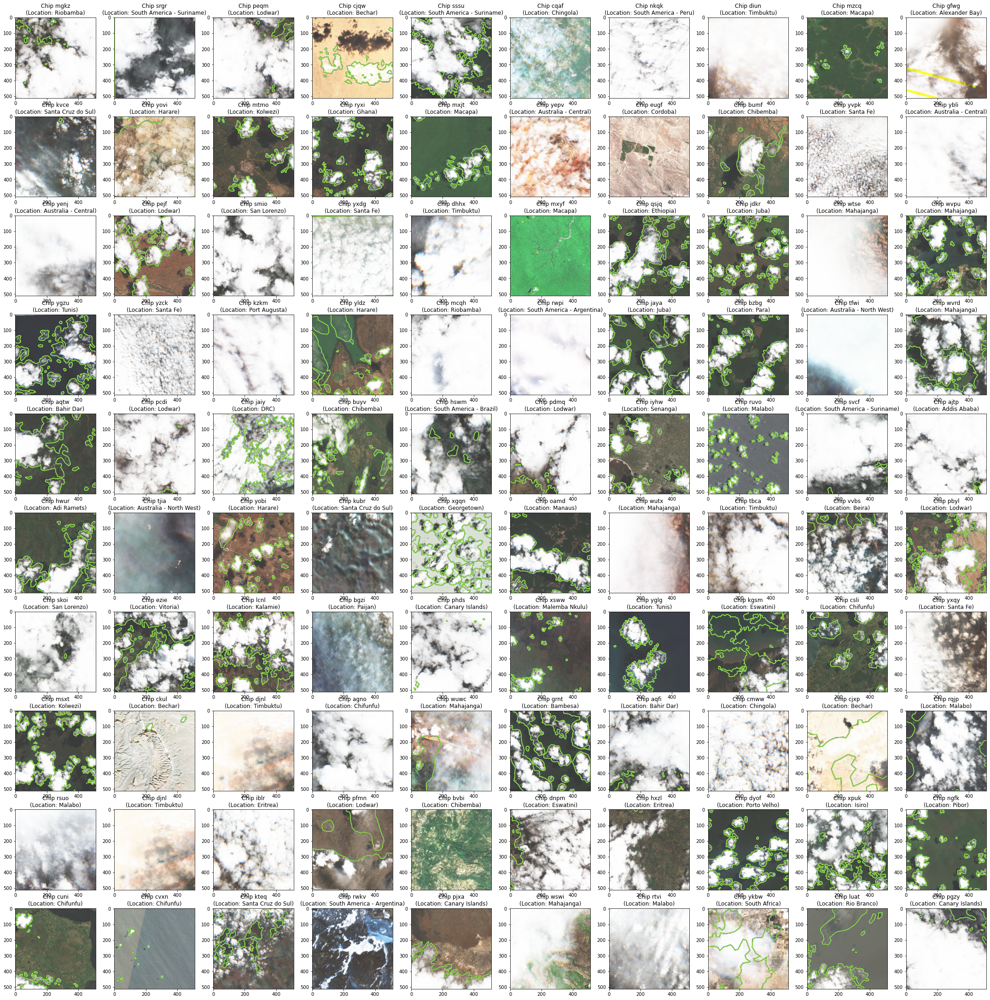

In [30]:
import math

def display_chips(random_state, nplt=1, figsize=None):
    
    nx = int(np.sqrt(nplt))
    ny = math.ceil(nplt/nx)
    if figsize is None:
        figsize=(nx*3, ny*3)
        
    fig, ax = plt.subplots(ny, nx, figsize=figsize)

    plt.subplots_adjust(hspace=0.02, wspace=0.2) 
    
    for iplt in range(nplt):
        iy = iplt // nx
        ix = iplt % nx
        
        random_chip = train_meta.sample(random_state=random_state+iplt).iloc[0]
        imi = load_image(random_chip.chip_id) 
        imi_label = np.array(Image.open(random_chip.label_path))
        imi_rgb = true_color_img(imi)

        ax[iy, ix].imshow(imi_rgb)
        ax[iy, ix].contour(imi_label)
        ax[iy, ix].set_title(f"Chip {random_chip.chip_id}\n(Location: {random_chip.location})")


    plt.tight_layout()
    plt.show()
        
display_chips(1, nplt=100)


In [31]:
from pystac_client import Client
import planetary_computer as pc

catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

In [32]:
collections = catalog.get_children()
for collection in collections:
    print(f"{collection.id} - {collection.title}")

gap - USGS Gap Land Cover
nasadem - NASADEM HGT v001
daymet-annual-na - Daymet Annual North America
hrea - HREA: High Resolution Electricity Access
daymet-monthly-hi - Daymet Monthly Hawaii
daymet-daily-na - Daymet Daily North America
daymet-monthly-na - Daymet Monthly North America
daymet-annual-pr - Daymet Annual Puerto Rico
daymet-daily-pr - Daymet Daily Puerto Rico
daymet-daily-hi - Daymet Daily Hawaii
daymet-monthly-pr - Daymet Monthly Puerto Rico
aster-l1t - ASTER L1T
daymet-annual-hi - Daymet Annual Hawaii
io-lulc - Esri 10-Meter Land Cover
jrc-gsw - JRC Global Surface Water
landsat-8-c2-l2 - Landsat 8 Collection 2 Level-2
mobi - MoBI: Map of Biodiversity Importance
mtbs - MTBS: Monitoring Trends in Burn Severity
terraclimate - TerraClimate
sentinel-2-l2a - Sentinel-2 Level-2A
us-census - US Census
cop-dem-glo-30 - Copernicus DEM GLO-30
cop-dem-glo-90 - Copernicus DEM GLO-90
fia - Forest Inventory and Analysis
gbif - Global Biodiversity Information Facility (GBIF)
goes-cmi - GOE

In [33]:
# io-lulc - Esri 10-Meter Land Cover
collection = "io-lulc"
land_cover = catalog.get_child(collection)

# "summaries":{"raster:bands":[{"nodata":0,"spatial_resolution":10}],"label:classes":[{"name":"","classes":["nodata","water","trees","grass","flooded veg","crops","scrub","built area","bare","snow/ice","clouds"]}]
for property, value in vars(land_cover.summaries).items():
    print(property, ":", value)
    
landcover_classes = land_cover.summaries._summaries['label:classes'][0]['classes']
landcover_classes

# for band in land_cover.extra_fields["summaries"]["eo:bands"]:
#     name = band["name"]
#     description = band["description"]
#     common_name = "" if "common_name" not in band else f"({band['common_name']})"
#     ground_sample_distance = band["gsd"]
#     print(f"{name} {common_name}: {description} ({ground_sample_distance}m resolution)")


_summaries : {'raster:bands': [{'nodata': 0, 'spatial_resolution': 10}], 'label:classes': [{'name': '', 'classes': ['nodata', 'water', 'trees', 'grass', 'flooded veg', 'crops', 'scrub', 'built area', 'bare', 'snow/ice', 'clouds']}]}
maxcount : 25
lists : {'raster:bands': [{'nodata': 0, 'spatial_resolution': 10}], 'label:classes': [{'name': '', 'classes': ['nodata', 'water', 'trees', 'grass', 'flooded veg', 'crops', 'scrub', 'built area', 'bare', 'snow/ice', 'clouds']}]}
ranges : {}
schemas : {}
other : {}


['nodata',
 'water',
 'trees',
 'grass',
 'flooded veg',
 'crops',
 'scrub',
 'built area',
 'bare',
 'snow/ice',
 'clouds']

/tmp/ipykernel_54155/1782024454.py:169: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("tab10").copy()
  cmap.set_bad(color='white')
/tmp/ipykernel_54155/1782024454.py:187: UserWarning: No contour levels were found within the data range.
  ax[0].contour(imi_label)
/tmp/ipykernel_54155/1782024454.py:200: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(landcover_classes[1:])
/tmp/ipykernel_54155/1782024454.py:200: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(landcover_classes[1:])
/tmp/ipykernel_54155/1782024454.py:191: UserWarning: No contour levels were found within the data range.
  ax[1].contour(landcoveri, levels=np.arange(len(landcover_class

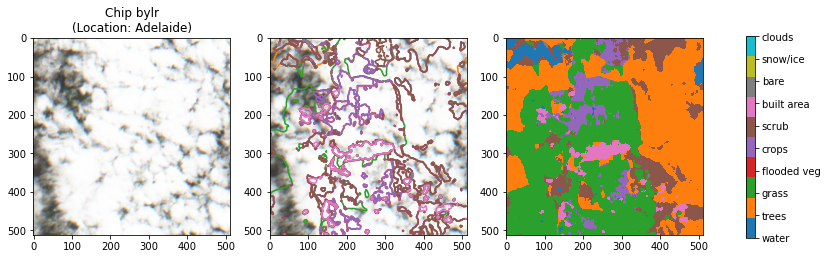

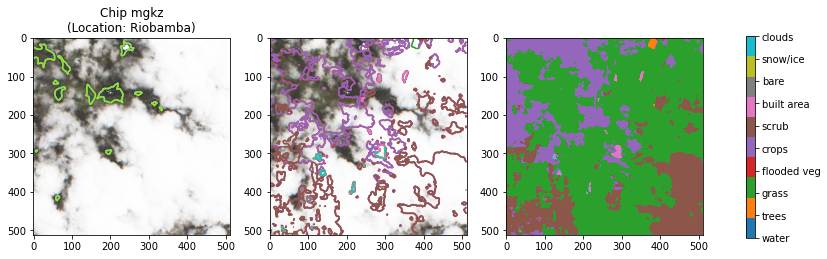

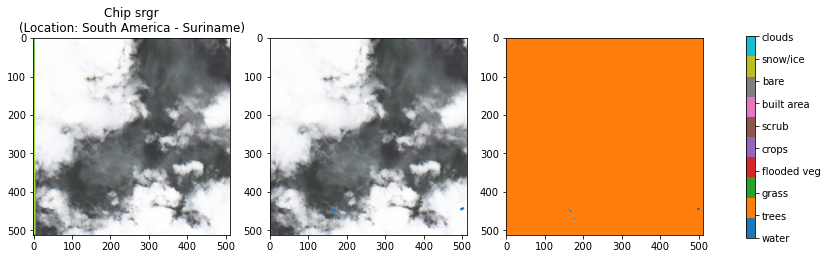

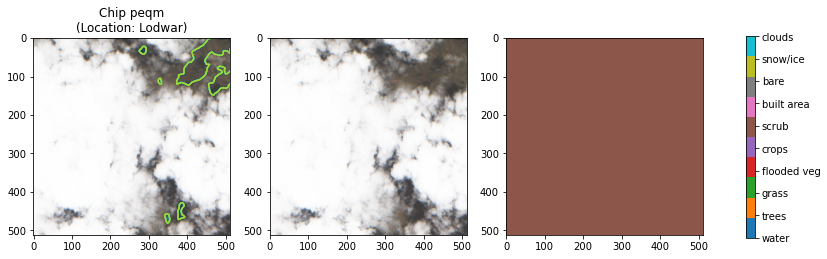

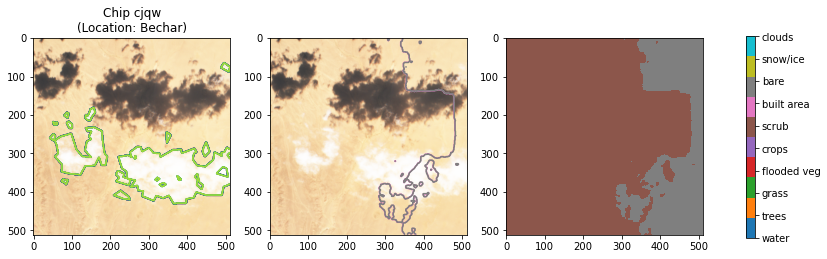

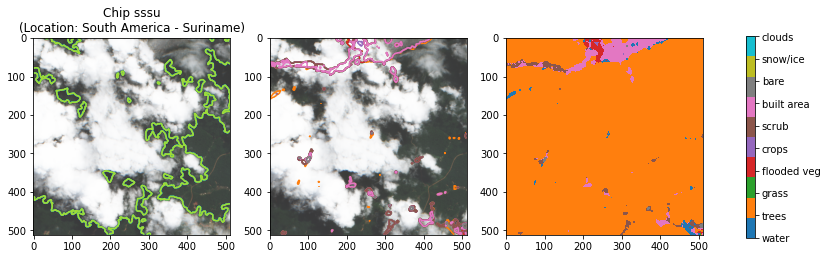

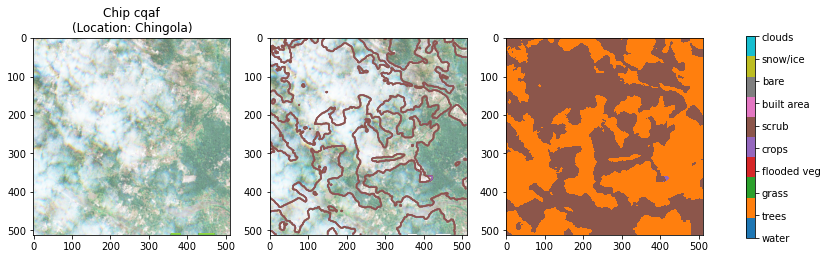

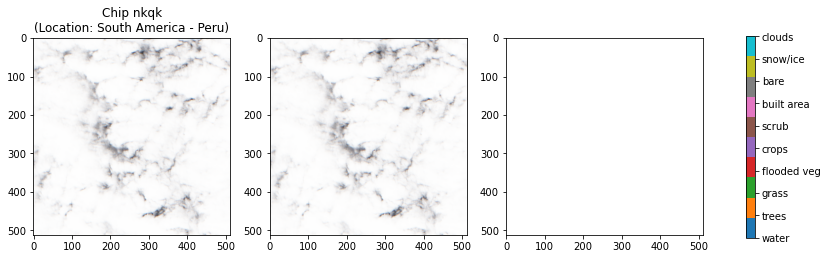

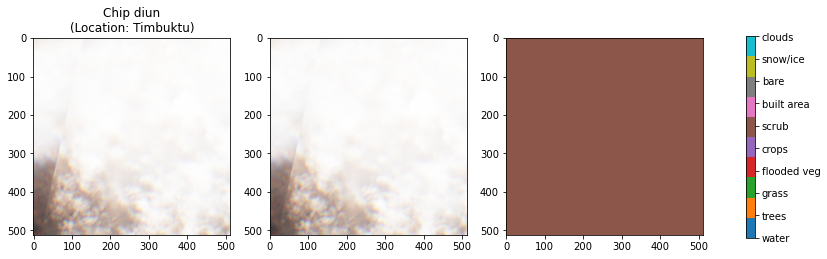

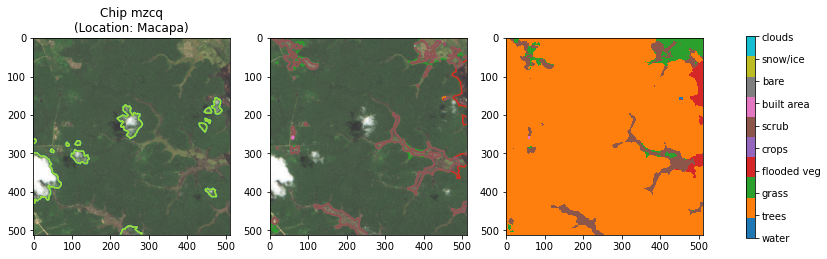

In [36]:
# https://planetarycomputer.microsoft.com/docs/tutorials/landcover/
import rasterio
from rasterio import windows
from rasterio import features
from rasterio import warp

import numpy as np
from PIL import Image

import stac_vrt
import rioxarray

import scipy.ndimage

def lat_long_bounds(filepath):
    """Given the path to a GeoTIFF, returns the image bounds in latitude and
    longitude coordinates.

    Returns points as a tuple of (left, bottom, right, top)
    """
    with rasterio.open(filepath) as im:
        bounds = im.bounds
        meta = im.meta
        
    # create a converter starting with the current projection
    current_crs = pyproj.CRS(meta["crs"])
    crs_transform = pyproj.Transformer.from_crs(current_crs, current_crs.geodetic_crs)

    # returns left, bottom, right, top
    return crs_transform.transform_bounds(*bounds)

def lat_lon_bounds_2(filepath: os.PathLike):
    """Given the path to a GeoTIFF, returns the image bounds in latitude and
    longitude coordinates.

    Returns points as a tuple of (left, bottom, right, top)
    
    from https://github.com/microsoft/PlanetaryComputerExamples/blob/main/competitions/cloud-cover/additional-bands-tutorial.ipynb
    """
    with rasterio.open(filepath) as im:
        bounds = im.bounds
        meta = im.meta
    # create a converter starting with the current projection
    return rasterio.warp.transform_bounds(
        meta["crs"],
        4326,  # code for the lat-lon coordinate system
        *bounds,
    )

def get_area_of_interest(chip):

    left, bottom, right, top = lat_long_bounds(chip["B04_path"])

    area_of_interest = {
        "type": "Polygon",
        "coordinates": [
            [
                [bottom, left],
                [bottom, right],
                [top, right],
                [top, left],
                [bottom, left],
            ]
        ],
    }

    return area_of_interest


def rebin(a, newshape ):
        '''Rebin an array to a new shape.
        '''
        assert len(a.shape) == len(newshape)

        slices = [ slice(0, old, float(old)/new) for old,new in zip(a.shape,newshape) ]
        coordinates = np.mgrid[slices]
        indices = coordinates.astype('i')   #choose the biggest smaller integer index
        
        return a[tuple(indices)]
    
def get_landcover(chip, time_of_interest, return_all=False):
    
    min_landcover_pix = 500
    rebin_xy = np.array([512, 512])
    
    area_of_interest = get_area_of_interest(chip)   

    search = catalog.search(
            collections=["io-lulc"],
            intersects=area_of_interest,
            datetime=time_of_interest)

    items = list(search.get_items())
                  
    items = sorted(items, key=lambda item: item.datetime.date()) # sort by latest last

    # Loop over all items, to find one with least missing values
    landcover_data = []
    masked_frac = []
    for itemi in items:
        asset_href = itemi.assets["data"].href
        signed_href = pc.sign(asset_href)

        # load landcover_datai
        with rasterio.open(signed_href) as ds:
            aoi_bounds = features.bounds(area_of_interest)
            warped_aoi_bounds = warp.transform_bounds("epsg:4326", ds.crs, *aoi_bounds)
            aoi_window = windows.from_bounds(transform=ds.transform, *warped_aoi_bounds)
            landcover_datai = ds.read(window=aoi_window)[0]     
            
        if (landcover_datai.shape[-2] < min_landcover_pix) or (landcover_datai.shape[-1] < min_landcover_pix):
            # if most data is missing then skip this one
            continue
            
        landcover_datai = rebin(landcover_datai, rebin_xy) # rebin to size of sentinel images, assuming aoi_window got the proper image extent..

        landcover_data.append(landcover_datai)
        masked_frac.append(len(landcover_datai[landcover_datai==0])/landcover_datai.flatten().shape[0])

        # print('aoi_bounds', aoi_bounds)
        # print('warped_aoi_bounds', warped_aoi_bounds)
        # print('aoi_window', aoi_window)
        # print(band_datai.shape)
        
    # return "best" landcover map, or attempt to make one
    if not return_all:
        if len(landcover_data) > 0:
            # return best landcover map, or construct one:
            ind_min = masked_frac.index(min(masked_frac))        
            # if masked_frac[ind_min] == 0.: # assume first map with no zeros is "best"
            landcover_data = landcover_data[ind_min]
        else:
            landcover_data = np.zeros((512, 512), dtype=np.uint8)
     
    return landcover_data


# nplt = 1

# time_of_interest = "2000-01-01/2022-01-01"

# cmap = plt.cm.tab10  # Can be any colormap that you want after the cm
# cmap.set_bad(color='white')

# for iplt in range(nplt):

#     chip = train_meta.sample(random_state=iplt).iloc[0] # chip to use

#     # get all land cover predictions for this tile
#     landcover = get_landcover(chip, time_of_interest)  
    
#     imi = load_image(chip.chip_id) 
#     imi_label = np.array(Image.open(chip.label_path))
#     imi_rgb = true_color_img(imi)

#     # plot
#     nx = len(landcover)+3
#     fig, ax = plt.subplots(1, nx, figsize=(nx*4, 4))
    
#     ax[0].imshow(imi_rgb)
#     ax[0].contour(imi_label)
#     ax[0].set_title(f"Chip {chip.chip_id}\n(Location: {chip.location})")

#     ax[1].imshow(imi_rgb)
#     ax[1].contour(landcover[0], levels=np.arange(len(landcover_classes)), cmap=cmap)

#     for i, lc in enumerate(landcover):
#         print('number of zeros', lc.min(), len(lc[lc==0])/lc.flatten().shape[0])

#         lc_masked = np.ma.masked_where(lc == 0., lc)

#         im = ax[i+2].imshow(lc_masked, vmin=1, vmax=10, cmap=cmap, interpolation='none')

#     diff = np.zeros_like(landcover[0])
#     diff[landcover[0] != landcover[-1]] = 1
#     ax[-1].imshow(diff, vmin=0, vmax=1, interpolation='none')

#     cbar_ax = fig.add_axes([0.95, 0.15, 0.01, 0.7])
#     cbar = fig.colorbar(im, cax=cbar_ax)
#     cbar.set_ticklabels(landcover_classes[1:])

#     # plt.colorbar(cb)
    
    
nplt = 10
collection = "io-lulc"

time_of_interest = "2000-01-01/2022-01-01"

cmap = plt.cm.tab10  # Can be any colormap that you want after the cm
cmap.set_bad(color='white')

for iplt in range(nplt):

    chip = train_meta.sample(random_state=iplt).iloc[0] # chip to use

    # get all land cover predictions for this tile
    landcoveri = get_landcover(chip, time_of_interest)  
    
    imi = load_image(chip.chip_id) 
    imi_label = np.array(Image.open(chip.label_path))
    imi_rgb = true_color_img(imi)

    # plot
    nx = 3
    fig, ax = plt.subplots(1, nx, figsize=(nx*4, 4))
    
    ax[0].imshow(imi_rgb)
    ax[0].contour(imi_label)
    ax[0].set_title(f"Chip {chip.chip_id}\n(Location: {chip.location})")

    ax[1].imshow(imi_rgb)
    ax[1].contour(landcoveri, levels=np.arange(len(landcover_classes)), cmap=cmap)

   
    landcover_masked = np.ma.masked_where(landcoveri == 0., landcoveri)

    im = ax[2].imshow(landcover_masked, vmin=1, vmax=10, cmap=cmap, interpolation='none')

    cbar_ax = fig.add_axes([0.95, 0.15, 0.01, 0.7])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.set_ticklabels(landcover_classes[1:])

    # plt.colorbar(cb)

/tmp/ipykernel_54155/3013458815.py:20: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("tab10").copy()
  cmap.set_bad(color='white')


10


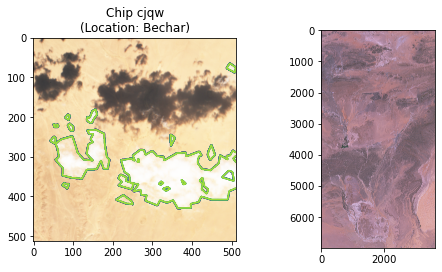

In [48]:
#Try getting band data, rather than landcover
from pystac_client import Client
from pystac.extensions.eo import EOExtension as eo
import planetary_computer as pc
import numpy as np
import xarray as xr

import rasterio.features
import stackstac
import pystac_client
import planetary_computer

import xrspatial.multispectral as ms

catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

time_of_interest = "2000-01-01/2022-01-01"

cmap = plt.cm.tab10  # Can be any colormap that you want after the cm
cmap.set_bad(color='white')

nplt = 1
for iplt in range(4,5):

    chip = train_meta.sample(random_state=iplt).iloc[0] # chip to use

    area_of_interest = get_area_of_interest(chip)   
    bbox = rasterio.features.bounds(area_of_interest)

    search = catalog.search(
        collections=["sentinel-2-l2a"],
        # intersects=area_of_interest,
        bbox=bbox,
        datetime=time_of_interest,
        limit=10,  # fetch items in batches of 500

        query={"eo:cloud_cover": {"lt": 10}},
    )

    items = list(search.get_items())[:10]
    print(len(items))
    signed_items = [planetary_computer.sign(item).to_dict() for item in items]

    data = (
    stackstac.stack(
        signed_items,
        assets=["B04", "B03", "B02"],  # red, green, blue
        chunksize=4096,
        resolution=30,
    )
    .where(lambda x: x > 0, other=np.nan)  # sentinel-2 uses 0 as nodata
    .assign_coords(band=lambda x: x.common_name.rename("band"))  # use common names
    )
    
    median = data.median(dim="time").compute()

    # Check how many items were returned
#     items = list(search.get_items())
#     print(f"Returned {len(items)} Items")

#     least_cloudy_item = sorted(items, key=lambda item: eo.ext(item).cloud_cover)[0]

#     print(
#         f"Choosing {least_cloudy_item.id} from {least_cloudy_item.datetime.date()}"
#         f" with {eo.ext(least_cloudy_item).cloud_cover}% cloud cover"
#     )

#     asset_href = least_cloudy_item.assets["visual"].href
#     signed_href = pc.sign(asset_href)

#     with rasterio.open(signed_href) as ds:
#         aoi_bounds = features.bounds(area_of_interest)
#         warped_aoi_bounds = warp.transform_bounds("epsg:4326", ds.crs, *aoi_bounds)
#         aoi_window = windows.from_bounds(transform=ds.transform, *warped_aoi_bounds)
#         band_data = ds.read(window=aoi_window)
        
        
    imi = load_image(chip.chip_id) 
    imi_label = np.array(Image.open(chip.label_path))
    imi_rgb = true_color_img(imi)

    # plot
    nx = 2
    fig, ax = plt.subplots(1, nx, figsize=(nx*4, 4))
    
    ax[0].imshow(imi_rgb)
    ax[0].contour(imi_label)
    ax[0].set_title(f"Chip {chip.chip_id}\n(Location: {chip.location})")

    img = ms.true_color(*median)  # expects red, green, blue DataArrays
    ax[1].imshow(img)

In [51]:
median.shape
# load landcover_datai
with median as ds:
    aoi_bounds = features.bounds(area_of_interest)
    warped_aoi_bounds = warp.transform_bounds("epsg:4326", ds.crs, *aoi_bounds)
    aoi_window = windows.from_bounds(transform=ds.transform, *warped_aoi_bounds)
    landcover_datai = ds.read(window=aoi_window)[0]     


AttributeError: 'DataArray' object has no attribute 'crs'

In [286]:
nimg = 1000
nchannel = 4
npix_x = 512
npix_y = 512
images = np.zeros((nimg, nchannel, npix_x, npix_y), dtype=np.uint16) 
labels = np.zeros((nimg, npix_x, npix_y), dtype=np.uint8) 
landcover = np.zeros((nimg, npix_x, npix_y), dtype=np.uint8) 

for i in range(nimg):
    if i%10==0:
        print(i)
    chip = train_meta.sample(random_state=150+i).iloc[0] # chip to use
    images[i] = load_image(chip.chip_id)
    labels[i] = np.array(Image.open(chip.label_path))
    landcover[i] = get_landcover(chip, time_of_interest)  

np.savez('../data/test_images_compiled.npz',
         images=images,
         labels=labels,
         landcover=landcover,
         landcover_classes=landcover_classes)

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990


In [279]:
landcover_classes
landcoveri.dtype
# images[0,:,-1,-1]

array([3746, 2890, 2788, 2514], dtype=uint16)

number of zeros 1 0.0
number of zeros 0 0.2638664245605469


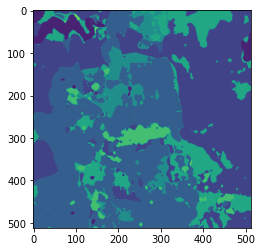

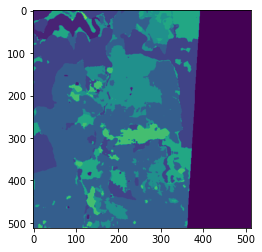

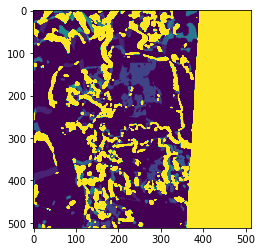

In [193]:
import scipy.interpolate as interp

def rebin(a, newshape ):
        '''Rebin an array to a new shape.
        '''
        assert len(a.shape) == len(newshape)

        slices = [ slice(0, old, float(old)/new) for old,new in zip(a.shape,newshape) ]
        coordinates = np.mgrid[slices]
        indices = coordinates.astype('i')   #choose the biggest smaller integer index
        return a[tuple(indices)]
    
rebin_xy = np.array([512, 512])

lcs = []
for i in range(len(landcover)):
    lc = rebin(landcover[i], rebin_xy)
    lcs.append(lc)
    print('number of zeros', lc.min(), len(lc[lc==0])/lc.flatten().shape[0])

    plt.figure()
    plt.imshow(lc, vmin=0, vmax=10)
    
plt.figure()
plt.imshow(lcs[1] - lcs[0], vmin=0, vmax=10)
        

Image coordinates (lat, long):
Start: (-1.385455738278118, -78.83376570205975)
End: (-1.3391257278605753, -78.78773265090366)
Returned 2 Items
Choosing 17M-2020 from 2020-06-01
(512, 512)


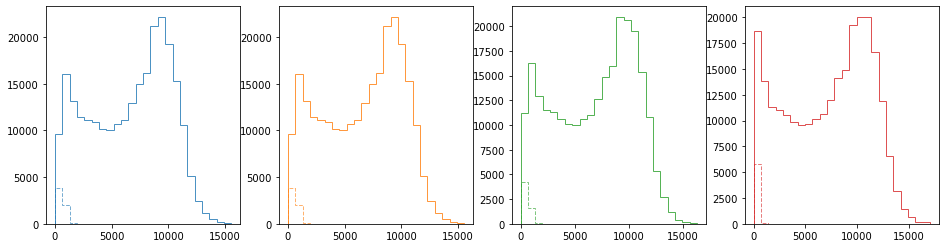

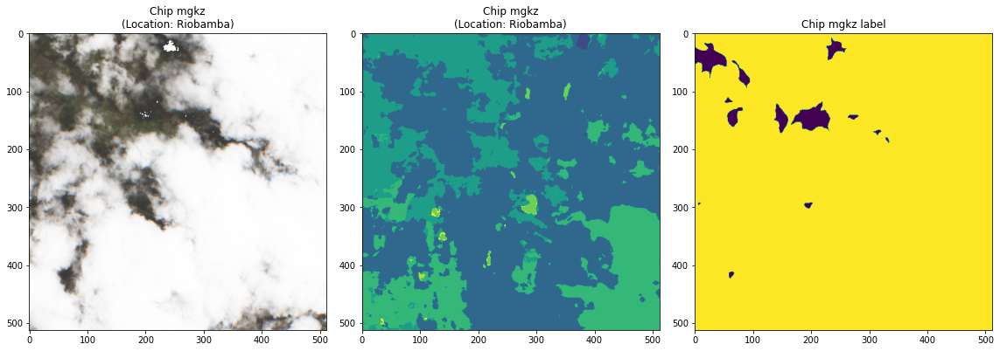

Image coordinates (lat, long):
Start: (4.523477590772273, -54.26900613315181)
End: (4.569919483842026, -54.22272755672494)
Returned 2 Items
Choosing 21N-2020 from 2020-06-01
(515, 515)


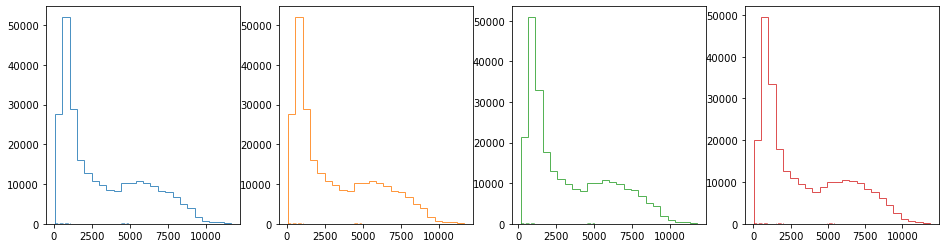

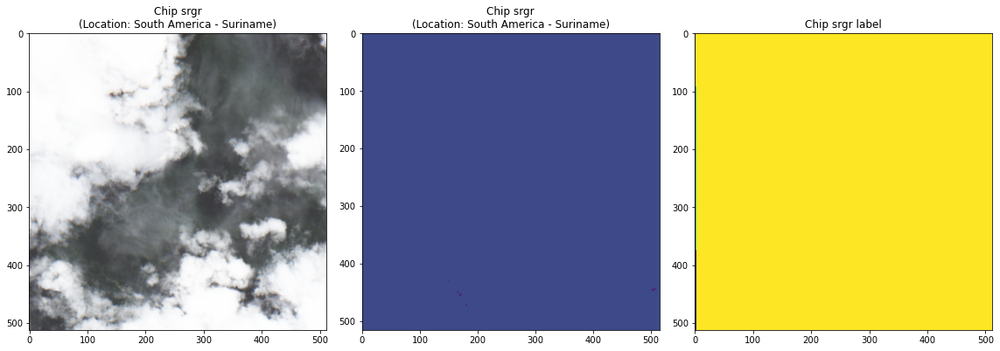

Image coordinates (lat, long):
Start: (3.506338716860272, 34.98374800413306)
End: (3.5527304566338267, 35.029917930660524)
Returned 2 Items
Choosing 36N-2020 from 2020-06-01
(514, 514)


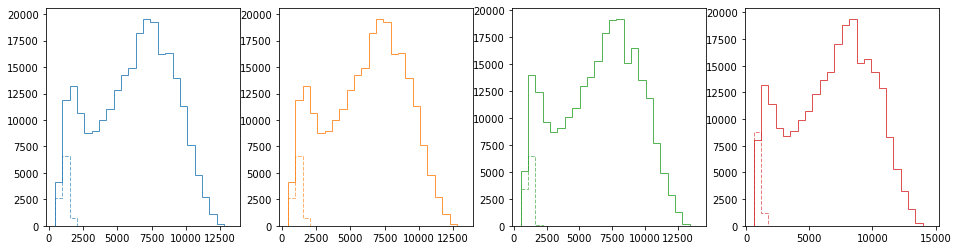

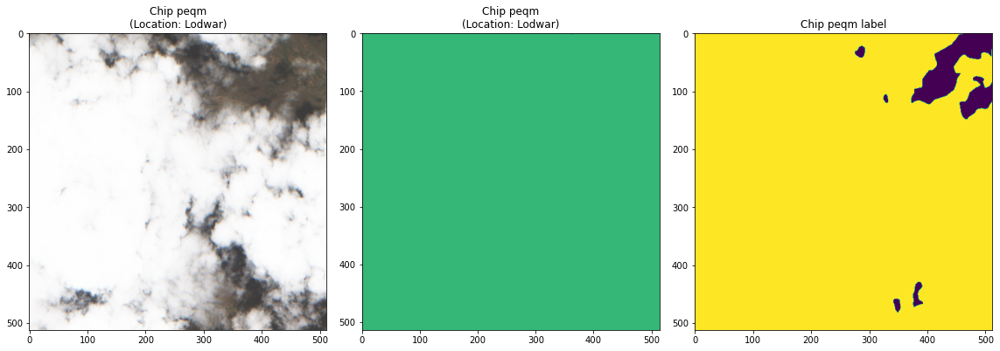

In [111]:
def display_random_chip_landcover(random_state, nplt=1, figsize=(8, 4)):
    for iplt in range(nplt):
        
        ichip = train_meta.sample(random_state=random_state+iplt).iloc[0]

        area_of_interest = get_area_of_interest(ichip)
       
        time_of_interest = "2000-01-01/2022-01-01"

        imi_landcover = get_landcover(area_of_interest, time_of_interest)             
        print(imi_landcover.shape)
        imi = load_image(ichip.chip_id)
        
        imi_label = np.array(Image.open(ichip.label_path))

        dm = imi_label == 1
        
        nchannel = imi.shape[0]
        fig, ax = plt.subplots(1, nchannel, figsize=(16,4))
        for ichannel in range(nchannel):
            bins = np.linspace(imi[ichannel].min(), imi[ichannel].max(), 25)
            ax[ichannel].hist(imi[ichannel][dm], bins=bins, color='C{:d}'.format(ichannel%10), alpha=0.8, histtype='step', facecolor=None)
            ax[ichannel].hist(imi[ichannel][~dm], bins=bins, color='C{:d}'.format(ichannel%10), alpha=0.6, histtype='step', facecolor=None, ls='--')
        
        
        imi_rgb = true_color_img(imi)

        fig, ax = plt.subplots(1, 3, figsize=figsize)
        ax[0].imshow(imi_rgb)
        ax[0].set_title(f"Chip {ichip.chip_id}\n(Location: {ichip.location})")
         
        ax[1].imshow(imi_landcover, vmin=0, vmax=9)
        ax[1].set_title(f"Chip {ichip.chip_id}\n(Location: {ichip.location})")
               
        ax[2].imshow(imi_label, vmin=0., vmax=1.)
        ax[2].set_title(f"Chip {ichip.chip_id} label")

        plt.tight_layout()
        plt.show()
        
display_random_chip_landcover(1, nplt=3, figsize=(16, 8))
        

In [81]:
items
items[0].assets

{'data': <Asset href=https://ai4edataeuwest.blob.core.windows.net/io-lulc/io-lulc-model-001-v01-composite-v03-supercell-v02-clip-v01/06V_20200101-20210101.tif>,
 'tilejson': <Asset href=https://planetarycomputer.microsoft.com/api/data/v1/item/tilejson.json?collection=io-lulc&items=06V-2020&assets=data&colormap_name=io-lulc>,
 'rendered_preview': <Asset href=https://planetarycomputer.microsoft.com/api/data/v1/item/preview.png?collection=io-lulc&items=06V-2020&assets=data&colormap_name=io-lulc>}

In [83]:
import rasterio
from rasterio import windows
from rasterio import features
from rasterio import warp

import numpy as np
from PIL import Image

with rasterio.open(signed_href) as ds:
    aoi_bounds = features.bounds(area_of_interest)
    warped_aoi_bounds = warp.transform_bounds("epsg:4326", ds.crs, *aoi_bounds)
    aoi_window = windows.from_bounds(transform=ds.transform, *warped_aoi_bounds)
    band_data = ds.read(window=aoi_window)

In [84]:
band_data.shape

(1, 4357, 6134)

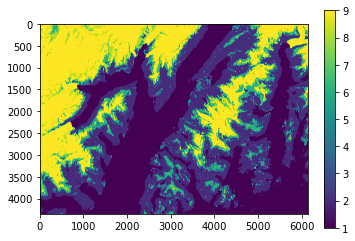

In [88]:
img = Image.fromarray(band_data[0])

plt.imshow(img)
plt.colorbar()